<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Project-Overview:" data-toc-modified-id="Project-Overview:-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Project Overview:</a></span></li><li><span><a href="#Obtain-Data-/-Import-Libraries:" data-toc-modified-id="Obtain-Data-/-Import-Libraries:-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Obtain Data / Import Libraries:</a></span></li><li><span><a href="#Pre-process-/-Scrub-Data:" data-toc-modified-id="Pre-process-/-Scrub-Data:-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Pre-process / Scrub Data:</a></span></li><li><span><a href="#Data-Exploration-/-Analysis:" data-toc-modified-id="Data-Exploration-/-Analysis:-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Data Exploration / Analysis:</a></span><ul class="toc-item"><li><span><a href="#Feature-Engineering:" data-toc-modified-id="Feature-Engineering:-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Feature Engineering:</a></span></li><li><span><a href="#One-Hot-Encoding:" data-toc-modified-id="One-Hot-Encoding:-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>One-Hot-Encoding:</a></span></li><li><span><a href="#Define-Features,-Target:" data-toc-modified-id="Define-Features,-Target:-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Define Features, Target:</a></span></li><li><span><a href="#Evaluating-Multicollinearity:" data-toc-modified-id="Evaluating-Multicollinearity:-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Evaluating Multicollinearity:</a></span></li></ul></li><li><span><a href="#Modeling:" data-toc-modified-id="Modeling:-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Modeling:</a></span><ul class="toc-item"><li><span><a href="#Pruning" data-toc-modified-id="Pruning-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Pruning</a></span></li><li><span><a href="#ROC/AUC:" data-toc-modified-id="ROC/AUC:-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>ROC/AUC:</a></span></li><li><span><a href="#Decision-Tree:" data-toc-modified-id="Decision-Tree:-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Decision Tree:</a></span><ul class="toc-item"><li><span><a href="#Gini" data-toc-modified-id="Gini-5.3.1"><span class="toc-item-num">5.3.1&nbsp;&nbsp;</span>Gini</a></span></li><li><span><a href="#Entropy:" data-toc-modified-id="Entropy:-5.3.2"><span class="toc-item-num">5.3.2&nbsp;&nbsp;</span>Entropy:</a></span></li></ul></li><li><span><a href="#Decision-Tree-Pruning-and-Hyper-Parameter-Optimization:" data-toc-modified-id="Decision-Tree-Pruning-and-Hyper-Parameter-Optimization:-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Decision Tree Pruning and Hyper-Parameter Optimization:</a></span></li><li><span><a href="#Using-Pipelines/GridSearch-to-tune-additional-models:" data-toc-modified-id="Using-Pipelines/GridSearch-to-tune-additional-models:-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>Using Pipelines/GridSearch to tune additional models:</a></span><ul class="toc-item"><li><span><a href="#Random-Forest:" data-toc-modified-id="Random-Forest:-5.5.1"><span class="toc-item-num">5.5.1&nbsp;&nbsp;</span>Random Forest:</a></span></li><li><span><a href="#Adaboosting:" data-toc-modified-id="Adaboosting:-5.5.2"><span class="toc-item-num">5.5.2&nbsp;&nbsp;</span>Adaboosting:</a></span></li><li><span><a href="#Bagging:" data-toc-modified-id="Bagging:-5.5.3"><span class="toc-item-num">5.5.3&nbsp;&nbsp;</span>Bagging:</a></span></li></ul></li></ul></li><li><span><a href="#Evaluation:" data-toc-modified-id="Evaluation:-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Evaluation:</a></span></li></ul></div>

## Project Overview:

**Flatiron Module 3 Project:**
* Classification - Predicting the Winner of Chess Games
* Instructor: Rafael Carrasco
* Student: Paul Woody
* Cohort: 041519

For this project, we'll be seeking to create a classification model to predict the winner of chess games by exploring the features within [this](https://www.kaggle.com/datasnaek/chess) 20,000 game chess database. 

To complete our analysis, we will follow the OSEMN Data Science process as outlined [here](https://medium.com/breathe-publication/life-of-data-data-science-is-osemn-f453e1febc10).

## Obtain Data / Import Libraries:

In [1]:
import pandas as pd
import numpy as np
import itertools
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
from statsmodels.formula.api import ols

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score 
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.externals import joblib
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, BaggingClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import roc_curve, auc, accuracy_score, confusion_matrix, classification_report, f1_score
from sklearn import svm, metrics, tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz, DecisionTreeRegressor
from imblearn.over_sampling import SMOTE, ADASYN
import io
import graphviz
import pydotplus
from PIL import Image
from IPython.display import Image
from sklearn.externals.six import StringIO

import warnings
warnings.filterwarnings('ignore')

To begin our analysis, we will first load the dataset and preview its contents. As we peruse the features of the dataset, we'll first pre-process the data, ensuring that any missing/null values are handled appropriately, and that dataset features are stored as the correct dtypes.

In [2]:
df = pd.read_csv('games.csv')

## Pre-process / Scrub Data:

In [3]:
print(df.columns)
print('')
print(df.info())
print('')
print(df.describe())
print('')
print('Missing Values?')
print(df.isna().any().any())
print('Null Values?')
print(df.isnull().any().any())
df.head(3)

Index(['id', 'rated', 'created_at', 'last_move_at', 'turns', 'victory_status',
       'winner', 'increment_code', 'white_id', 'white_rating', 'black_id',
       'black_rating', 'moves', 'opening_eco', 'opening_name', 'opening_ply'],
      dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20058 entries, 0 to 20057
Data columns (total 16 columns):
id                20058 non-null object
rated             20058 non-null bool
created_at        20058 non-null float64
last_move_at      20058 non-null float64
turns             20058 non-null int64
victory_status    20058 non-null object
winner            20058 non-null object
increment_code    20058 non-null object
white_id          20058 non-null object
white_rating      20058 non-null int64
black_id          20058 non-null object
black_rating      20058 non-null int64
moves             20058 non-null object
opening_eco       20058 non-null object
opening_name      20058 non-null object
opening_ply       20058 non-null int64

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1.504210e+12,1.504210e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
1,l1NXvwaE,True,1.504130e+12,1.504130e+12,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4
2,mIICvQHh,True,1.504130e+12,1.504130e+12,61,mate,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3


As seen above, there are no missing values in the dataset.

## Data Exploration / Analysis:

Taking a closer look at the 'moves' feature in the dataset, we can observe that the column contains the complete set of moves for each Chess game, stored as strings.

### Feature Engineering:

Here's an example of the recorded moves for a Chess game from the dataset:
```
'd4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5 Bf4'
```

At first consideration, this feature doesn't appear to possess much value as a predictor, as there are trillions of potential combinations of Chess moves that can produce a completed game. However, applying a modest amount of Chess know-how, we can put this feature to work in a big way through feature engineering.

Since we know that white always moves first, by splitting the moves column into individual moves (as elements of a list), we can determine that every odd element represents a move made by white. From there, we're able to continue to produce new features based what moves are made, and when. For example, castling is a move that can be made in special circumstances. For the purposes of our analysis, these circumstances are unimportant. What is important to know is that castling helps to protect the King, and that by making the decision to castle earlier, one has less potential to fall victim to enemy attacks.

Since we're pretty sure that castling early (a fundamental theory of Chess) is a good thing, we can determine which player castled first by searching for the index of its notation within our newly manipulated 'moves' column.

We'll use this same strategy to engineer other features as well, such as counting the number of enemy pieces captured by each player and calculating the difference in player rating between white and black.

In [4]:
def first_capture(moves):
    for index, move in enumerate(moves.split()):
        if 'x' in move:
            if index%2==0:
                return 'white'
            else:
                return 'black'
    return None


def count_captures(moves):
    white_captures = 0
    black_captures = 0
    for index, move in enumerate(moves.split()):
        if 'x' in move:
            if index%2 == 0:
                white_captures += 1
            else:
                black_captures += 1
    return white_captures + black_captures

def white_captures(moves):
    white_captures = 0
    black_captures = 0
    for index, move in enumerate(moves.split()):
        if 'x' in move:
            if index%2 == 0:
                white_captures += 1
            else:
                black_captures += 1
    return white_captures

def black_captures(moves):
    white_captures = 0
    black_captures = 0
    for index, move in enumerate(moves.split()):
        if 'x' in move:
            if index%2 == 0:
                white_captures += 1
            else:
                black_captures += 1
    return black_captures

def count_n_captures(moves, n=3):
    white_captures = 0
    black_captures = 0
    for index, move in enumerate(moves.split()):
        if 'x' in move:
            if index%2 == 0:
                white_captures += 1
            else:
                black_captures += 1
        if white_captures == n or black_captures == n:
            return 'white' if white_captures == n else 'black'
        
def first_castle(moves):
    for index, move in enumerate(moves.split()):
        if move in ('O-O', 'O-O-O'):
            color = 'white' if index%2==0 else 'black'
            return '{}_{}'.format(color, move.replace("-", "_"))
    return None 

def display_acc_and_f1_score(true, preds, model_name):
    acc = accuracy_score(true, preds)
    f1 = f1_score(true, preds)
    print("Model: {}".format(model_name))
    print("Accuracy: {}".format(acc))
    print("F1-Score: {}".format(f1))
    
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    # Check if Normalization Option is Set to True. 
    # If so, normalize the raw confusion matrix before visualizing
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized Confusion Matrix")
    else:
        print('Confusion Matrix, without Normalization')
        
    # Print CNF Matrix
    print(cm)
    
    # Create the Matrix
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    
    # Add Title, Axis Labels:
    # . classes = class_names
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    
    # Add cell labels:
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()    

def make_features(df, n):
    df['first_capture'] = df['moves'].apply(first_capture)
    df['count_captures'] = df['moves'].apply(count_captures)
    df['white_captures'] = df['moves'].apply(white_captures)
    df['black_captures'] = df['moves'].apply(black_captures)
    n_captures = [count_n_captures(move, n) for move in df['moves']]
    df[f'count_{n}_captures'] = n_captures
    df['first_castle'] = df['moves'].apply(first_castle)
    return df

In [5]:
df = make_features(df, n=5)
df.head(3)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,...,moves,opening_eco,opening_name,opening_ply,first_capture,count_captures,white_captures,black_captures,count_5_captures,first_castle
0,TZJHLljE,False,1.504210e+12,1.504210e+12,13,outoftime,white,15+2,bourgris,1500,...,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5,white,3,2,1,None,None
1,l1NXvwaE,True,1.504130e+12,1.504130e+12,16,resign,black,5+10,a-00,1322,...,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4,white,5,2,3,None,None
2,mIICvQHh,True,1.504130e+12,1.504130e+12,61,mate,white,5+10,ischia,1496,...,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3,white,17,14,3,white,None


In [6]:
df.winner.value_counts()

white    10001
black     9107
draw       950
Name: winner, dtype: int64

In [7]:
df['rating_difference'] = (df['white_rating'] - df['black_rating'])

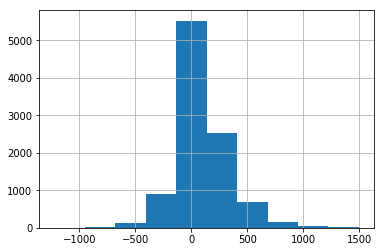

In [8]:
df.rating_difference[df.winner == 'white'].hist()

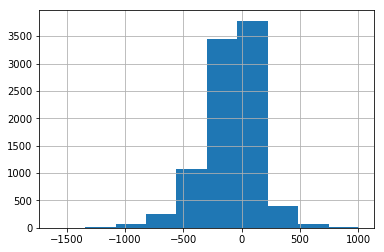

In [9]:
df.rating_difference[df.winner == 'black'].hist()

In [10]:
df.moves[0].split()

['d4',
 'd5',
 'c4',
 'c6',
 'cxd5',
 'e6',
 'dxe6',
 'fxe6',
 'Nf3',
 'Bb4+',
 'Nc3',
 'Ba5',
 'Bf4']

In [11]:
df.iloc[2]

id                                                            mIICvQHh
rated                                                             True
created_at                                                 1.50413e+12
last_move_at                                               1.50413e+12
turns                                                               61
victory_status                                                    mate
winner                                                           white
increment_code                                                    5+10
white_id                                                        ischia
white_rating                                                      1496
black_id                                                          a-00
black_rating                                                      1500
moves                e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...
opening_eco                                                        C20
openin

In [12]:
first_castle(df.moves[4])

'black_O_O'

In [13]:
# Creating first_move column:
df['first_move'] = df['moves'].apply(lambda x: x.split(' ')[0])

In [14]:
# Splitting time into minutes and increment_seconds:
df['minutes'] = df['increment_code'].apply(lambda x: x.split('+')[0])
df.minutes = df.minutes.astype(int)

df['increment_secs'] = df['increment_code'].apply(lambda x: x.split('+')[1])
df.increment_secs = df.increment_secs.astype(int)
df.head(3)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,...,first_capture,count_captures,white_captures,black_captures,count_5_captures,first_castle,rating_difference,first_move,minutes,increment_secs
0,TZJHLljE,False,1.504210e+12,1.504210e+12,13,outoftime,white,15+2,bourgris,1500,...,white,3,2,1,None,None,309,d4,15,2
1,l1NXvwaE,True,1.504130e+12,1.504130e+12,16,resign,black,5+10,a-00,1322,...,white,5,2,3,None,None,61,d4,5,10
2,mIICvQHh,True,1.504130e+12,1.504130e+12,61,mate,white,5+10,ischia,1496,...,white,17,14,3,white,None,-4,e4,5,10


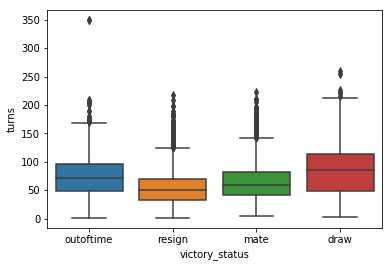

In [15]:
g = sns.boxplot(x = 'victory_status', y = 'turns', data = df)

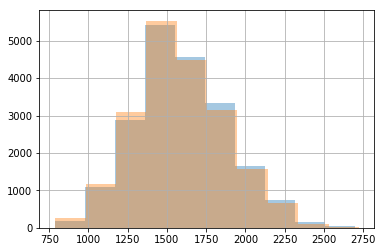

In [16]:
# Distribution of player ratings:
g = df.white_rating.hist(alpha=.4), df.black_rating.hist(alpha=.4)

In [17]:
df.rated.replace({False: 0, True: 1}, inplace=True)
print(df.winner.value_counts())
print('')
print(df.rated.value_counts())

white    10001
black     9107
draw       950
Name: winner, dtype: int64

1    16155
0     3903
Name: rated, dtype: int64


After our initial exploration of the dataset, we have a better understanding of the significance of each feature, but are not yet ready to begin modeling. Before testing feature multicollinearity and importance, let's first drop several columns that don't contain useful information. Additionally, in our set of 20,000 games, there are only 950 draws. Because of the relatively small sample size of the 'draw' event space, we'll discard all drawn games from the dataset before modeling.

In [18]:
# Drop unnecessary features from dataframe:
df.drop(['id', 'created_at', 'last_move_at', 'white_id', 'black_id'], axis=1, inplace=True)

In [19]:
df = df[df['winner'] != 'draw']
df.winner.unique()

array(['white', 'black'], dtype=object)

In [20]:
# Winner vs. First move:

df[['first_move', 'winner', 'victory_status']].groupby(['first_move', 'winner']).count()#.plot(kind='barh')

victory_status
first_move winner                
Na3        black                3
           white                1
Nc3        black               55
           white               42
Nf3        black              292
           white              373
Nh3        black                6
           white                9
a3         black                9
           white               17
a4         black               18
           white                9
b3         black               83
           white               82
b4         black               36
           white               48
c3         black               25
           white               31
c4         black              305
           white              383
d3         black               79
           white               50
d4         black             2043
           white             2258
e3         black              255
           white              142
e4         black             5651
           white             6371
f3         black               13
           white                8
f4         black               82
           white               68
g3         black               95
           white               85
g4         black               25
           white               11
h3         black                7
           white                7
h4         black               25
           white                6

### One-Hot-Encoding:

Next, we must one-hot-encode categorical features of the dataset (such as the first moves) in order to calculate their strengths as predictors for the outcome of a Chess game.

In [21]:
# Creating Dummies and Dropping Columns:
first_move_dummies = pd.get_dummies(df.first_move, prefix = 'first')
df.drop(['first_move'], axis=1, inplace=True)
df.drop(['moves'], axis=1, inplace=True)
df = pd.concat([df, first_move_dummies], axis=1)

# Removing games with no pieces captured and creating dummies
df = df[df.first_capture != 'no']
first_capture_dummies = pd.get_dummies(df.first_capture, prefix = 'first_cap')
df = pd.concat([df, first_capture_dummies], axis=1)

#first_5_capture_dummies = pd.get_dummies(df.first_5_captures, prefix = 'first_5_cap')
#df = pd.concat([df, first_5_capture_dummies], axis=1)

first_castle_dummies = pd.get_dummies(df.first_castle, prefix = 'first_castle')
df.drop(['first_castle'], axis=1, inplace=True)
df = pd.concat([df, first_castle_dummies], axis=1)

victory_status_dummies = pd.get_dummies(df.victory_status, prefix='victory')
df = pd.concat([df, victory_status_dummies], axis=1)
df.drop(['victory_status'], axis=1, inplace=True)

opening_eco_dummies = pd.get_dummies(df.opening_eco, prefix='opening_eco')
df.drop(['opening_eco'], axis=1, inplace=True)
df = pd.concat([df, opening_eco_dummies], axis=1)

df.drop(['opening_name', 'increment_code'], axis=1, inplace=True)

df.head(3)

,rated,turns,winner,white_rating,black_rating,opening_ply,first_capture,count_captures,white_captures,black_captures,...,opening_eco_E81,opening_eco_E87,opening_eco_E88,opening_eco_E90,opening_eco_E91,opening_eco_E92,opening_eco_E94,opening_eco_E95,opening_eco_E97,opening_eco_E98
0,0,13,white,1500,1191,5,white,3,2,1,...,0,0,0,0,0,0,0,0,0,0
1,1,16,black,1322,1261,4,white,5,2,3,...,0,0,0,0,0,0,0,0,0,0
2,1,61,white,1496,1500,3,white,17,14,3,...,0,0,0,0,0,0,0,0,0,0


In [22]:
# Selecting 8 most common first moves:
moves_to_use = first_move_dummies.sum().sort_values(ascending=False).head(8).index.tolist()
moves_to_use

['first_e4',
 'first_d4',
 'first_c4',
 'first_Nf3',
 'first_e3',
 'first_g3',
 'first_b3',
 'first_f4']

In [23]:
df.describe()

,rated,turns,white_rating,black_rating,opening_ply,count_captures,white_captures,black_captures,rating_difference,minutes,...,opening_eco_E81,opening_eco_E87,opening_eco_E88,opening_eco_E90,opening_eco_E91,opening_eco_E92,opening_eco_E94,opening_eco_E95,opening_eco_E97,opening_eco_E98
count,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,...,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000
mean,0.807829,59.188664,1593.702167,1586.227863,4.805055,14.149414,7.100429,7.048985,7.474304,13.677203,...,0.000366,0.000157,0.000157,0.001518,0.000314,0.000105,0.000314,0.000052,0.000105,0.000105
std,0.394017,32.310010,289.949727,290.146458,2.782938,7.161172,3.781300,3.800723,250.654368,16.703647,...,0.019137,0.012529,0.012529,0.038929,0.017718,0.010230,0.017718,0.007234,0.010230,0.010230
min,0.000000,1.000000,784.000000,789.000000,1.000000,0.000000,0.000000,0.000000,-1605.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,37.000000,1395.000000,1389.000000,3.000000,9.000000,4.000000,4.000000,-108.000000,10.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,54.000000,1564.000000,1560.000000,4.000000,14.000000,7.000000,7.000000,3.000000,10.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,77.000000,1788.000000,1781.000000,6.000000,19.000000,10.000000,10.000000,123.000000,15.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,349.000000,2700.000000,2723.000000,28.000000,29.000000,15.000000,15.000000,1499.000000,180.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [24]:
df.first_capture.replace({'black': 0, 'white': 1}, inplace=True)
df.drop(['count_5_captures', 'white_rating', 'black_rating', 'first_capture'], axis=1, inplace=True)

### Define Features, Target:

Now that we have completed feature engineering and explored the dataset, we are ready to define the features (X) and target (y) in preparation to fit our first model. In order to attempt to balance the effect that feature size might have on model-training, we'll also normalize dataset features.

In [25]:
# Segment featues/target as X:
y = df[['winner']]
X = df.drop(['winner'], axis=1)

X.columns

Index(['rated', 'turns', 'opening_ply', 'count_captures', 'white_captures',
       'black_captures', 'rating_difference', 'minutes', 'increment_secs',
       'first_Na3',
       ...
       'opening_eco_E81', 'opening_eco_E87', 'opening_eco_E88',
       'opening_eco_E90', 'opening_eco_E91', 'opening_eco_E92',
       'opening_eco_E94', 'opening_eco_E95', 'opening_eco_E97',
       'opening_eco_E98'],
      dtype='object', length=397)

In [26]:
# Normalizing features:
for col in X.columns:
    X[col] = (X[col] - min(X[col])) / (max(X[col]) - min(X[col]))

In [27]:
X.describe()

,rated,turns,opening_ply,count_captures,white_captures,black_captures,rating_difference,minutes,increment_secs,first_Na3,...,opening_eco_E81,opening_eco_E87,opening_eco_E88,opening_eco_E90,opening_eco_E91,opening_eco_E92,opening_eco_E94,opening_eco_E95,opening_eco_E97,opening_eco_E98
count,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,...,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000,19108.000000
mean,0.807829,0.167209,0.140928,0.487911,0.473362,0.469932,0.519483,0.075984,0.028518,0.000209,...,0.000366,0.000157,0.000157,0.001518,0.000314,0.000105,0.000314,0.000052,0.000105,0.000105
std,0.394017,0.092845,0.103072,0.246937,0.252087,0.253382,0.080752,0.092798,0.077706,0.014467,...,0.019137,0.012529,0.012529,0.038929,0.017718,0.010230,0.017718,0.007234,0.010230,0.010230
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.103448,0.074074,0.310345,0.266667,0.266667,0.482281,0.055556,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.152299,0.111111,0.482759,0.466667,0.466667,0.518041,0.055556,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.218391,0.185185,0.655172,0.666667,0.666667,0.556701,0.083333,0.038889,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Evaluating Multicollinearity:

Before continuing, let's evaluate our features for Multicollinearity and determine which features will have the greatest significance to the target, the winner of the chess game. Because the model input currently contains 397 columns, it is highly likely that overfitting would highly skew the results of our classification models. To determine how best to proceed, let's review feature distribution as well as feature correlation.

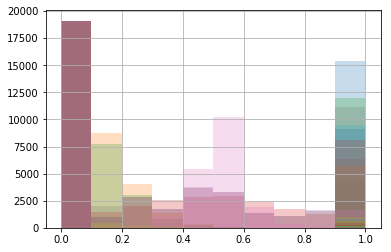

In [28]:
for col in X.columns:
    X[col].hist(alpha=.25)

In [29]:
print(X.shape)
print(y.shape)
y.head(3)

(19108, 397)
(19108, 1)


,winner
0,white
1,black
2,white


In [30]:
# Split the data into train and test sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.20)

In [31]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(15286, 397) (15286, 1)
(3822, 397) (3822, 1)


In [32]:
X_train.head()

,rated,turns,opening_ply,count_captures,white_captures,black_captures,rating_difference,minutes,increment_secs,first_Na3,...,opening_eco_E81,opening_eco_E87,opening_eco_E88,opening_eco_E90,opening_eco_E91,opening_eco_E92,opening_eco_E94,opening_eco_E95,opening_eco_E97,opening_eco_E98
13827,0.0,0.126437,0.074074,0.379310,0.466667,0.266667,0.556379,0.055556,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2678,0.0,0.031609,0.037037,0.068966,0.000000,0.133333,0.486469,0.027778,0.055556,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4822,1.0,0.201149,0.185185,0.689655,0.733333,0.600000,0.709729,0.083333,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3515,1.0,0.097701,0.111111,0.379310,0.400000,0.333333,0.519330,0.055556,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16440,1.0,0.252874,0.000000,0.586207,0.466667,0.666667,0.563466,0.055556,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [33]:
# Fit Logistic Regression model:
logreg = LogisticRegression(fit_intercept = False, C = 1e12, verbose=1) 
logreg.fit(X_train, y_train)

# Predict:
y_hat_test = logreg.predict(X_test)
y_hat_train = logreg.predict(X_train)

[LibLinear]

In [34]:
logreg.score(X_test, y_test), logreg.score(X_train, y_train)

(0.8249607535321821, 0.833769462253042)

In [35]:
cnf_matrix = confusion_matrix(y_hat_test, y_test)
print('Confusion Matrix:\n', cnf_matrix)

Confusion Matrix:
 [[1482  341]
 [ 328 1671]]


Normalized Confusion Matrix
[[0.81294569 0.18705431]
 [0.16408204 0.83591796]]


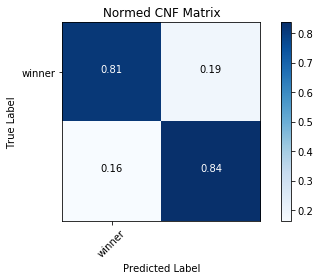

In [36]:
# Visualizing Normalized CNF Matrix:
class_names = set(y)

plt.figure()
plot_confusion_matrix(cnf_matrix, classes = class_names, normalize=True, title='Normed CNF Matrix')
plt.show()

In [37]:
for col1 in X.columns:
    for col2 in X.columns:
        if col2 == col1:
            pass
        else:
            corr = np.corrcoef(X[col1], X[col2])[0][1]
            if corr > 0.20:
                print(col1, col2, corr)

turns count_captures 0.902324632561528
turns white_captures 0.8492617869860856
turns black_captures 0.8552024322183666
opening_ply first_e4 0.24756085059362945
count_captures turns 0.902324632561528
count_captures white_captures 0.9441999655760515
count_captures black_captures 0.9447854648425917
white_captures turns 0.8492617869860855
white_captures count_captures 0.9441999655760516
white_captures black_captures 0.7841343948308672
black_captures turns 0.8552024322183666
black_captures count_captures 0.9447854648425917
black_captures white_captures 0.7841343948308672
minutes increment_secs 0.46571018003737585
increment_secs minutes 0.46571018003737585
first_Nf3 opening_eco_A04 0.6000265044291428
first_Nf3 opening_eco_A06 0.2632816802325545
first_Nh3 opening_eco_E00 0.5267356758771649
first_b3 opening_eco_A01 0.9595424101658202
first_b4 opening_eco_A00 0.2696175939217139
first_c3 opening_eco_A00 0.20820766220256123
first_c4 opening_eco_A10 0.4146857390398746
first_c4 opening_eco_A20 0.36

Text(0.5, 1.0, 'Multicollinearity between Features')

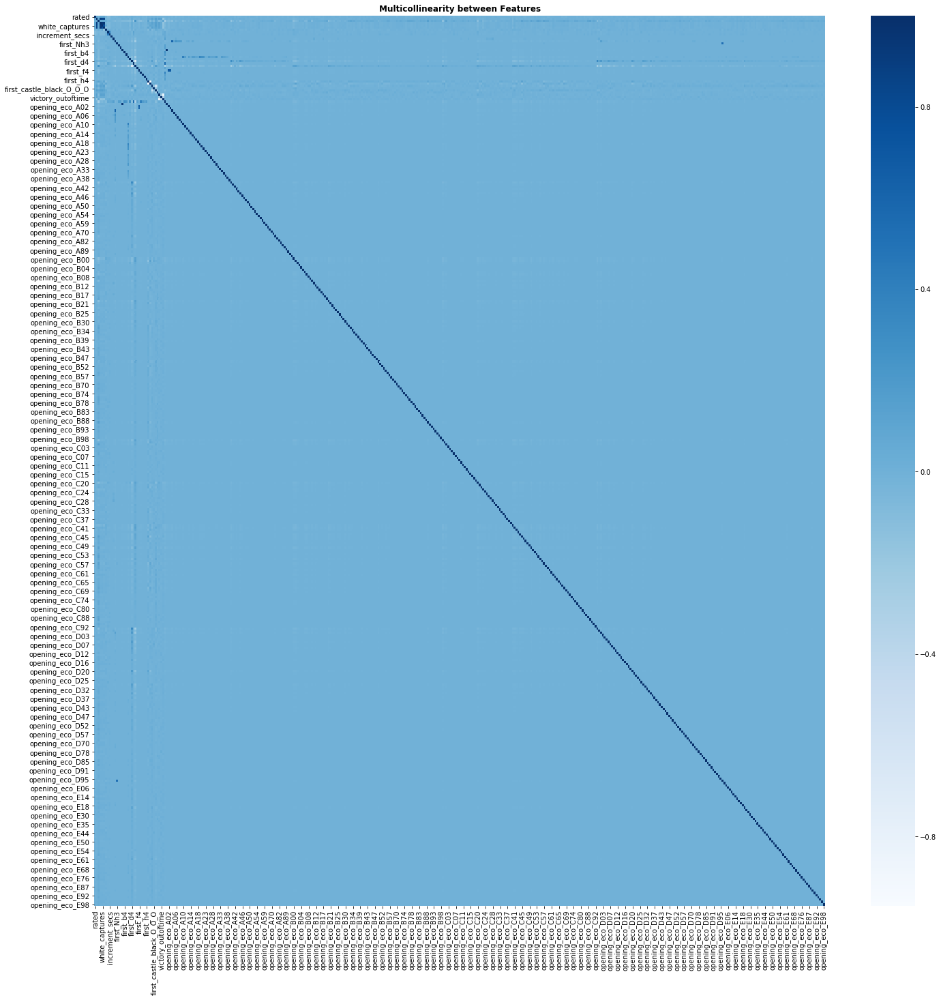

In [38]:
# Evaluating multicollinearity:
corr = X.corr()
fig = plt.figure(figsize=(24,24))
sol = (corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))
                 .stack()
                 .sort_values(ascending=False))
ax = sns.heatmap(corr, xticklabels='auto', yticklabels='auto', annot=False, cmap='Blues', cbar=True)
ax.set_title("Multicollinearity between Features", fontweight='semibold')

## Modeling:

As seen by the heatmap above, there are numerous features (most weak predictors for our target variable) with high correlation to one another. These correlations will result in a model that performs extremely well on the training dataset, but is too specific to perform well as a classifier when fed new data outside of the training subset.

In order to remove multicollinearity we will fit a model and assess the predictive strength of each feature.

### Pruning

In [39]:
rf = RandomForestClassifier(n_estimators = 100)
rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [40]:
# Feature Importance
features = pd.DataFrame(columns = ['feature', 'importance'])
features['feature']    = X.columns
features['importance'] = rf.feature_importances_
features.sort_values('importance', ascending=False)

,feature,importance
6,rating_difference,0.161352
5,black_captures,0.123291
4,white_captures,0.120992
1,turns,0.088998
3,count_captures,0.079273
2,opening_ply,0.041986
7,minutes,0.041567
8,increment_secs,0.036361
37,victory_resign,0.012351
0,rated,0.012199


In [41]:
# Refit DT using pruned features:
y = df[['winner']]
X = df[['rating_difference', 'black_captures', 'white_captures', 'opening_ply', 'minutes', 'increment_secs', 'rated', 'victory_resign', 'victory_mate', 'first_castle_white_O_O', 'first_castle_black_O_O']]

In [42]:
y.winner.replace({'black': 0, 'white': 1}, inplace=True)

After pruning, we're now ready to re-assess multicollinearity and proceed with tuning our model.

Text(0.5, 1.0, 'Multicollinearity between Features')

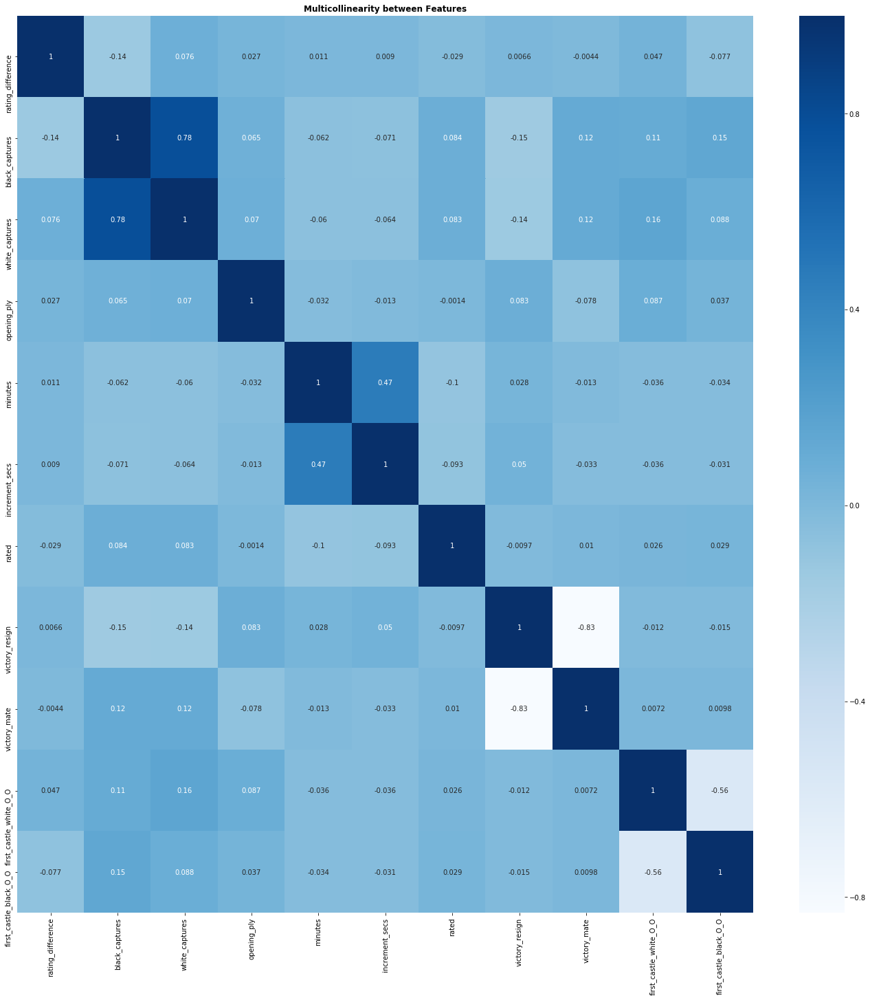

In [43]:
# Evaluating multicollinearity:
corr = X.corr()
fig = plt.figure(figsize=(24,24))
sol = (corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))
                 .stack()
                 .sort_values(ascending=False))
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, cmap='Blues', cbar=True)
ax.set_title("Multicollinearity between Features", fontweight='semibold')

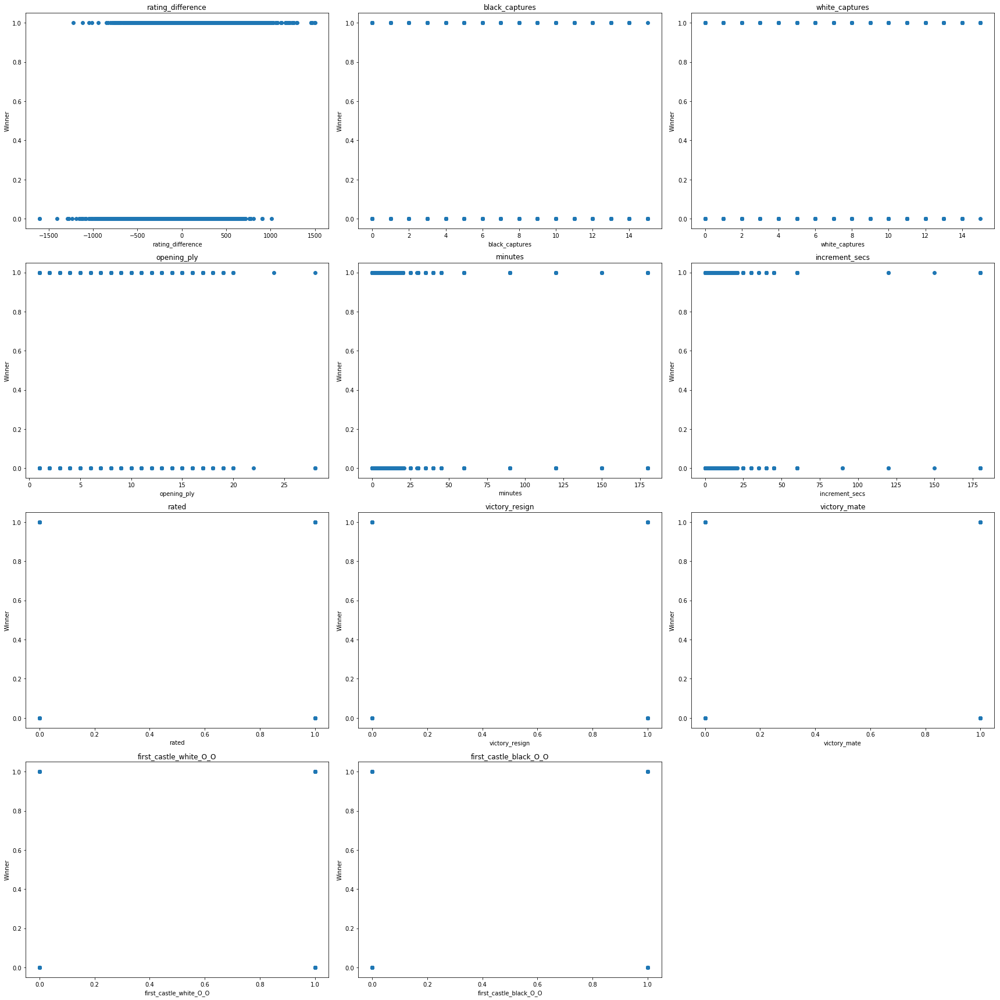

In [44]:
# Create scatter plots for each feature vs. target
plt.figure(figsize=(24, 24))
for i, col in enumerate(X.columns):
    plt.subplot(4, 3, i+1)
    plt.plot(X[col], y, 'o')
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('Winner')
    plt.tight_layout()

### ROC/AUC:

AUC: 0.9018513230012193


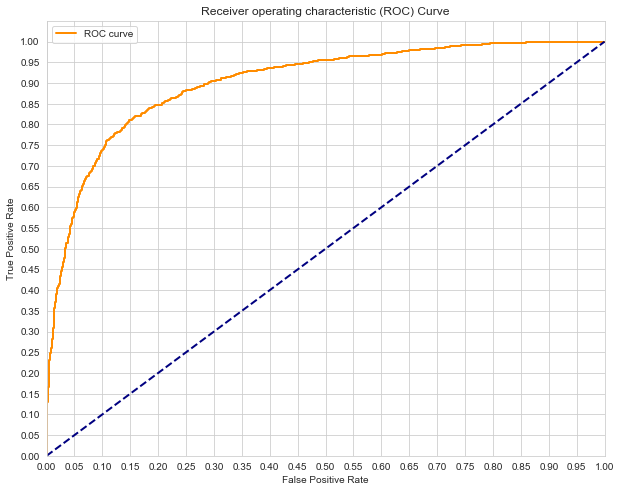

In [45]:
#Initial Model:
logreg = LogisticRegression(fit_intercept = False)
model_log = logreg.fit(X_train, y_train)

# Probability scores for test set:
y_score = logreg.fit(X_train, y_train).decision_function(X_test)

# False Positive Rate (fpr) and True Positive Rate (tpr):
fpr, tpr, thresholds = roc_curve(y_true=y_test, y_score=y_score, pos_label='white')

sns.set_style('whitegrid')

# Print AUC, Plot ROC Curve:
print('AUC: {}'.format(auc(fpr, tpr)))
plt.figure(figsize=(10,8))
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc="best")
plt.show()

Next we will employ various techniques in order to tune our initial model:

LogisticRegression(C=0.001, class_weight=None, dual=False,
          fit_intercept=False, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l2', random_state=None,
          solver='warn', tol=0.0001, verbose=0, warm_start=False)
AUC for 0.001: 0.7115736520105884
LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=False,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)
AUC for 0.01: 0.8677314565644805
LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=False,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)
AUC for 0.1: 0.9001386707380029
LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=False,
          intercept_scaling

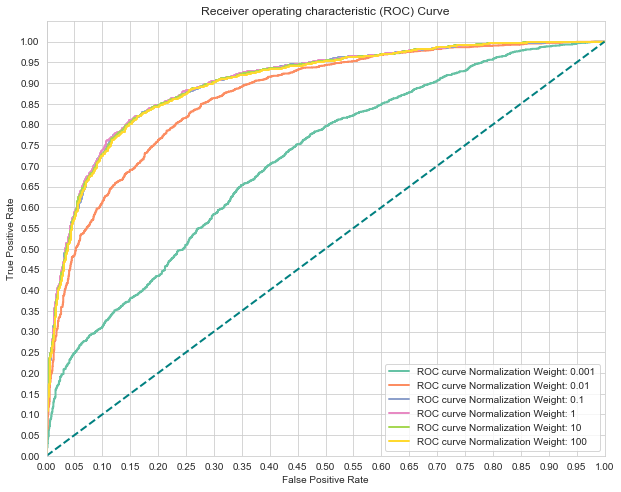

In [46]:
C_param_range = [0.001,0.01,0.1,1,10,100]
names = [0.001,0.01,0.1,1,10,100]
colors = sns.color_palette('Set2')

plt.figure(figsize=(10,8))

for n, c in enumerate(C_param_range):
    # Fit a model:
    logreg = LogisticRegression(fit_intercept = False, C = c)
    logreg = logreg.fit(X_train, y_train)
    print(logreg) #Preview model params

    #Predict
    y_hat_test = logreg.predict(X_test)

    y_score = logreg.fit(X_train, y_train).decision_function(X_test)

    fpr, tpr, thresholds = roc_curve(y_test, y_score, pos_label='white')
    
    print('AUC for {}: {}'.format(names[n], auc(fpr, tpr)))
    lw = 2
    plt.plot(fpr, tpr, color=colors[n],
             lw=lw, label='ROC curve Normalization Weight: {}'.format(names[n]))
plt.plot([0, 1], [0, 1], color='teal', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='best')
plt.show()

In [47]:
y.winner.replace({'black': 0, 'white': 1}, inplace=True)

TypeError: Cannot compare types 'ndarray(dtype=int64)' and 'str'

### Decision Tree:

In [48]:
# Split the data into train and test sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.20)

#### Gini

In [49]:
# Train Decision Tree Classifier:
classifier = DecisionTreeClassifier()
classifier.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [50]:
# Make Predictions for test data:
y_pred = classifier.predict(X_test)

In [51]:
y_hat_test = classifier.predict(X_test)
y_hat_train = classifier.predict(X_train)

In [52]:
# Calculate Accuracy , AUC and Confusion matrix 
acc = accuracy_score(y_test,y_pred) * 100
print("Accuracy is :{0}".format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))
print(classification_report(y_true=y_test, y_pred=y_pred))

Accuracy is :75.85034013605441

AUC is :0.76
              precision    recall  f1-score   support

           0       0.74      0.75      0.75      1809
           1       0.77      0.77      0.77      2013

   micro avg       0.76      0.76      0.76      3822
   macro avg       0.76      0.76      0.76      3822
weighted avg       0.76      0.76      0.76      3822



#### Entropy:

Accuracy is :77.2893772893773

AUC is :0.77
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.250235 to fit



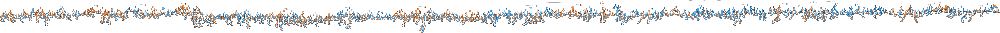

In [53]:
# Train a DT classifier using entropy:
classifier2 = DecisionTreeClassifier(random_state=10, criterion='entropy')  
classifier2.fit(X_train, y_train)  

# Make predictions for test data
y_pred = classifier2.predict(X_test) 

# Calculate Accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print("Accuracy is :{0}".format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

dot_data = io.StringIO()
export_graphviz(classifier2, out_file=dot_data, filled=True, rounded=True,special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

AUC: 0.7581075414449527


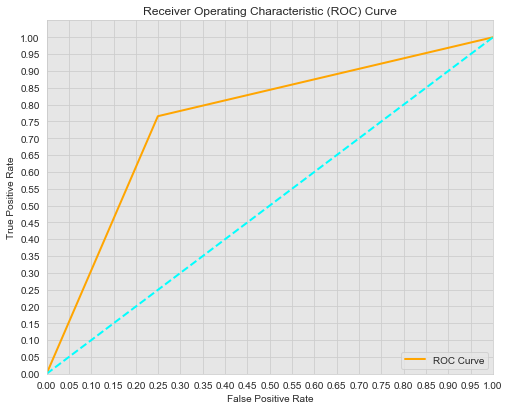

In [54]:
fpr, tpr, thresholds = roc_curve(y_test, y_hat_test)

sns.set_style('whitegrid', {'axes.facecolor': '.9'})

print(f'AUC: {auc(fpr, tpr)}')
plt.figure(figsize=(8,6.5))
lw=2

plt.plot(fpr, tpr, color='orange', lw=lw, label='ROC Curve')
plt.plot([0,1], [0,1], color='cyan', lw=lw, linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

### Decision Tree Pruning and Hyper-Parameter Optimization:

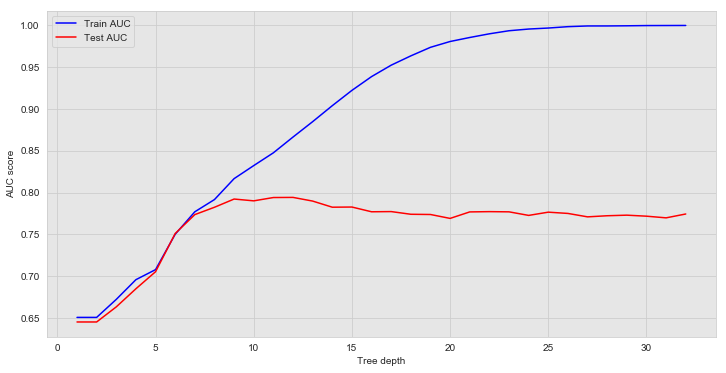

In [55]:
# Identify the optimal tree depth for given data
max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
   dt = DecisionTreeClassifier(criterion='entropy', max_depth=max_depth)
   dt.fit(X_train, y_train)
   train_pred = dt.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   # Add auc score to previous train results
   train_results.append(roc_auc)
   y_pred = dt.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   # Add auc score to previous test results
   test_results.append(roc_auc)
plt.figure(figsize=(12,6))
plt.plot(max_depths, train_results, 'b', label='Train AUC')
plt.plot(max_depths, test_results, 'r', label='Test AUC')
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.legend()
plt.show()

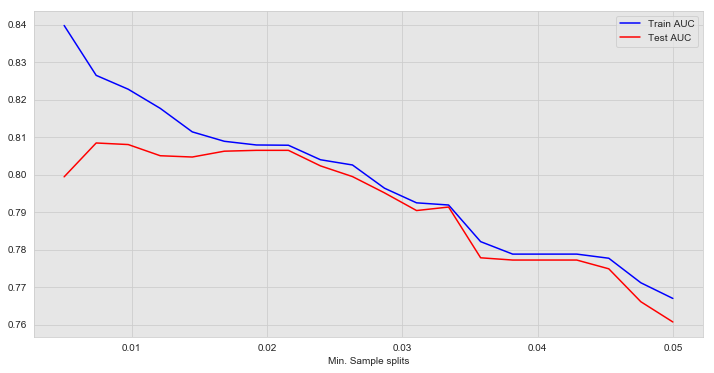

In [56]:
# Identify the optimal min-samples-split for given data
min_samples_splits = np.linspace(0.005, 0.05, 20.0, endpoint=True)
train_results = []
test_results = []
for min_samples_split in min_samples_splits:
   dt = DecisionTreeClassifier(criterion='entropy', min_samples_split=min_samples_split)
   dt.fit(X_train, y_train)
   train_pred = dt.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
plt.figure(figsize=(12,6))
plt.plot(min_samples_splits, train_results, 'b', label='Train AUC')
plt.plot(min_samples_splits, test_results, 'r', label='Test AUC')
plt.xlabel('Min. Sample splits')
plt.legend()
plt.show()

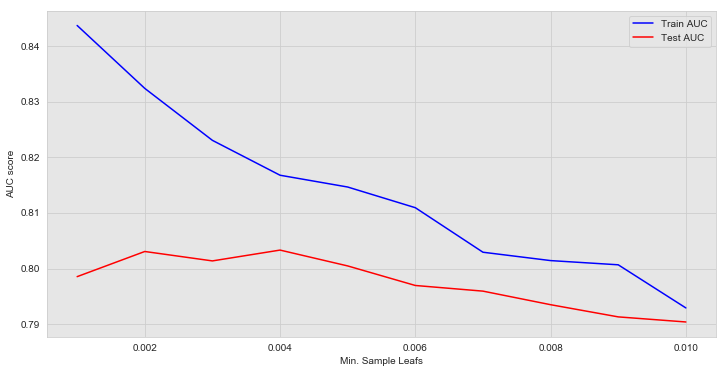

In [57]:
# Calculate the optimal value for minimum sample leafs

min_samples_leafs = np.linspace(0.001, 0.01, 10, endpoint=True)
train_results = []
test_results = []
for min_samples_leaf in min_samples_leafs:
   dt = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=min_samples_leaf)
   dt.fit(X_train, y_train)
   train_pred = dt.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
    

plt.figure(figsize=(12,6))    
plt.plot(min_samples_leafs, train_results, 'b', label='Train AUC')
plt.plot(min_samples_leafs, test_results, 'r', label='Test AUC')
plt.ylabel('AUC score')
plt.xlabel('Min. Sample Leafs')
plt.legend()
plt.show()    

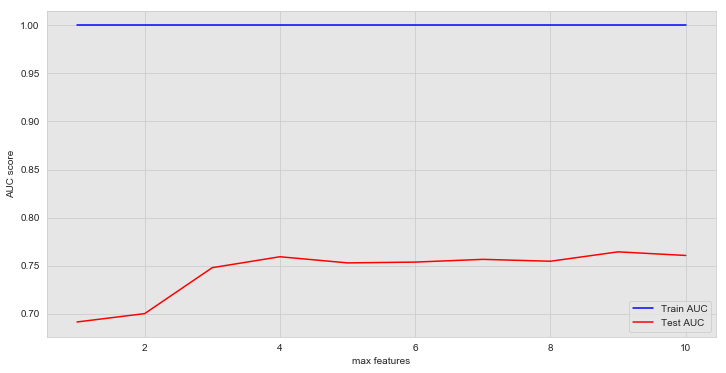

In [58]:
# Find the best value for optimal maximum feature size
max_features = list(range(1,X_train.shape[1]))
train_results = []
test_results = []
for max_feature in max_features:
   dt = DecisionTreeClassifier(criterion='entropy', max_features=max_feature)
   dt.fit(X_train, y_train)
   train_pred = dt.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)

    
plt.figure(figsize=(12,6))
plt.plot(max_features, train_results, 'b', label='Train AUC')
plt.plot(max_features, test_results, 'r', label='Test AUC')

plt.ylabel('AUC score')
plt.xlabel('max features')
plt.legend()
plt.show()    

In [59]:
# Train DTclassifier with optimal values identified above:
dt = DecisionTreeClassifier(criterion='entropy',
                           max_features=4,
                           max_depth=8,
                           min_samples_split=0.012,
                           min_samples_leaf=.004)
dt.fit(X_train, y_train)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print(roc_auc)
print(classification_report(y_true=y_test, y_pred=y_pred))

0.7605876891416408
              precision    recall  f1-score   support

           0       0.75      0.75      0.75      1809
           1       0.77      0.78      0.77      2013

   micro avg       0.76      0.76      0.76      3822
   macro avg       0.76      0.76      0.76      3822
weighted avg       0.76      0.76      0.76      3822



### Using Pipelines/GridSearch to tune additional models:

#### Random Forest:

In [60]:
# Construct pipeline
pipe_rf = Pipeline([('clf', RandomForestClassifier(random_state = 123))])

# Set grid search params
param_grid_forest = [ 
  {'clf__n_estimators': [50, 70, 90],
   'clf__criterion': ['entropy', 'gini'], 
   'clf__max_depth': [4, 5, 6, 7],  
   'clf__min_samples_leaf':[0.001 ,0.01, 0.05],  
   'clf__min_samples_split':[0.001 ,0.01, 0.05]
  }
]

# Construct grid search
gs_rf = GridSearchCV(estimator=pipe_rf,
            param_grid=param_grid_forest,
            scoring='accuracy',
            cv=3, verbose=2, return_train_score = True)

# Fit using grid search
gs_rf.fit(X_train, y_train)

# Best accuracy
print('Best accuracy: %.3f' % gs_rf.best_score_)

# Best params
print('\nBest params:\n', gs_rf.best_params_)

Fitting 3 folds for each of 216 candidates, totalling 648 fits
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50 
[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=

[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=entropy, clf__max_depth=4, clf_

[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=50 
[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=4, clf__min_sa

[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=5, clf_

[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=50 
[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=50 
[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_sa

[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.05, clf__n_estimators=70, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.05, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.05, clf__n_estimators=70, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.05, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.05, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.05, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.05, clf__n_estimators=90, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=5, clf__min_sa

[CV]  clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=50 
[CV]  clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=50 
[CV]  clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=50 
[CV]  clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=6, clf_

[CV]  clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.05, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.05, clf__min_samples_split=0.001, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.05, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.05, clf__min_samples_split=0.001, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.05, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.05, clf__min_samples_split=0.001, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=0.05, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=6, clf_

[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.5s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.5s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=50 
[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=50, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=50 
[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=50, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=7, c

[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=70 
[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.4s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_sa

[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=90 
[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.05, clf__n_estimators=50 
[CV]  clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.05, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=entropy, clf__max_depth=7, clf__min_sa

[CV]  clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=50 
[CV]  clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.001,

[CV]  clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=90 
[CV]  clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=90 
[CV]  clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.05, clf__min_samples_split=0.001, clf__n_estimators=50 
[CV]  clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.05, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=0.05, clf__

[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf

[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90 
[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=50 
[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=50 
[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.01, clf__min_samples_split=0.01, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.01, clf_

[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=90 
[CV]  clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=0.05, clf__mi

[CV]  clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.001, clf__min_samples_split=0.01, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=50 
[CV]  clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=50 
[CV]  clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=50 
[CV]  clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.001, clf__min_samples_split=0.05, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.001,

[CV]  clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=90 
[CV]  clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=90 
[CV]  clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__min_samples_split=0.05, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=0.01, clf__mi

[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50 
[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50 
[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.001, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf

[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=70, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90 
[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90 
[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.4s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90 
[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.01, clf__min_samples_split=0.001, clf__n_estimators=90, total=   0.3s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.01, 

[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=50 
[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=50, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70 
[CV]  clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__min_samples_split=0.01, clf__n_estimators=70, total=   0.2s
[CV] clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=0.05, clf__mi

[Parallel(n_jobs=1)]: Done 648 out of 648 | elapsed:  3.5min finished


Best accuracy: 0.785

Best params:
 {'clf__criterion': 'gini', 'clf__max_depth': 7, 'clf__min_samples_leaf': 0.001, 'clf__min_samples_split': 0.001, 'clf__n_estimators': 90}


#### Adaboosting:

In [61]:
pipe_ab = Pipeline([('clf', AdaBoostClassifier(random_state = 123))])

# Set grid search params
adaboost_param_grid = {
    'clf__n_estimators': [30, 50, 70, 90],
    'clf__learning_rate': [1.0, 0.5, 0.1]
}

# Construct grid search
gs_ab = GridSearchCV(estimator=pipe_ab,
            param_grid=adaboost_param_grid,
            scoring='accuracy',
            cv=3, verbose=2, return_train_score = True)

# Fit using grid search
gs_ab.fit(X_train, y_train)

# Best accuracy
print('Best accuracy: %.3f' % gs_ab.best_score_)

# Best params
print('\nBest params:\n', gs_ab.best_params_)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
[CV] clf__learning_rate=1.0, clf__n_estimators=30 ....................
[CV] ..... clf__learning_rate=1.0, clf__n_estimators=30, total=   0.1s
[CV] clf__learning_rate=1.0, clf__n_estimators=30 ....................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV] ..... clf__learning_rate=1.0, clf__n_estimators=30, total=   0.1s
[CV] clf__learning_rate=1.0, clf__n_estimators=30 ....................
[CV] ..... clf__learning_rate=1.0, clf__n_estimators=30, total=   0.1s
[CV] clf__learning_rate=1.0, clf__n_estimators=50 ....................
[CV] ..... clf__learning_rate=1.0, clf__n_estimators=50, total=   0.3s
[CV] clf__learning_rate=1.0, clf__n_estimators=50 ....................
[CV] ..... clf__learning_rate=1.0, clf__n_estimators=50, total=   0.2s
[CV] clf__learning_rate=1.0, clf__n_estimators=50 ....................
[CV] ..... clf__learning_rate=1.0, clf__n_estimators=50, total=   0.2s
[CV] clf__learning_rate=1.0, clf__n_estimators=70 ....................
[CV] ..... clf__learning_rate=1.0, clf__n_estimators=70, total=   0.3s
[CV] clf__learning_rate=1.0, clf__n_estimators=70 ....................
[CV] ..... clf__learning_rate=1.0, clf__n_estimators=70, total=   0.3s
[CV] clf__learning_rate=1.0, clf__n_estimators=70 ....................
[CV] .

[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:   12.4s finished


Best accuracy: 0.820

Best params:
 {'clf__learning_rate': 1.0, 'clf__n_estimators': 90}


#### Bagging:

Now that we've identified the optimal parameters for each model, let's re-split the data and run each model with a cross-fold-validation of 10. Using numpy, we will take the average score produced by each model in order to determine which model performs best.

In [62]:
# Split the data into train and test sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.10)

In [63]:
# Make Predictions for test data:
y_pred = classifier.predict(X_test)
y_hat_train = classifier.predict(X_train)

In [64]:
# Test Various Models:
lr = LogisticRegression(fit_intercept=False, C=100, solver='lbfgs')
rf = RandomForestClassifier(n_estimators = 90)
bt = BaggingClassifier(DecisionTreeClassifier(criterion='entropy', max_depth=8), n_estimators=90)
at = AdaBoostClassifier(learning_rate=1.0, n_estimators=90)
#nb = MultinomialNB()

models = {
    'Logistic Regression' : lr,
    'Random Forest'       : rf,
    'Bagged Tree'         : bt,
    'Adaboost Tree'       : at
#    'Mult. Naive Bayes'   : nb
}

for name, model in models.items():
    model.fit(X_train, y_train)
    print(name, end = '')
    # Calculating Scores:
    scores = cross_val_score(model, X, y, cv=10)
    print(' - mean score: ', np.mean(scores))

Logistic Regression - mean score:  0.8248381410406866
Random Forest - mean score:  0.8219059307271458
Bagged Tree - mean score:  0.8057360826397231
Adaboost Tree - mean score:  0.8204943718042659


In [69]:
classifier = AdaBoostClassifier(learning_rate=1.0, n_estimators=90)
classifier.fit(X_train, y_train)  

# Make predictions for test data
y_pred = classifier.predict(X_test) 

# Calculate Accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print("Accuracy is :{0}".format(acc))

Accuracy is :80.53375196232338


Accuracy is :80.53375196232338

AUC is :0.81
              precision    recall  f1-score   support

           0       0.82      0.79      0.80       955
           1       0.79      0.82      0.81       956

   micro avg       0.81      0.81      0.81      1911
   macro avg       0.81      0.81      0.81      1911
weighted avg       0.81      0.81      0.81      1911



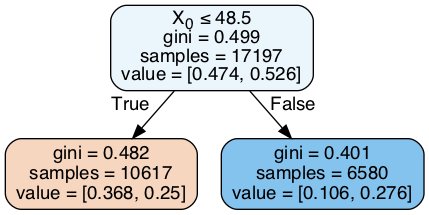

In [70]:
# Calculate Accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print("Accuracy is :{0}".format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))
print(classification_report(y_true=y_test, y_pred=y_pred))

dot_data = io.StringIO()
tree.export_graphviz(classifier.estimators_[0], out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

Confusion Matrix:
 [[751 168]
 [204 788]]
Normalized Confusion Matrix
[[0.8171926  0.1828074 ]
 [0.20564516 0.79435484]]


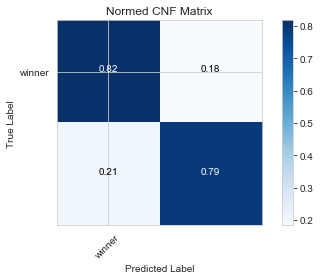

In [71]:
cnf_matrix = confusion_matrix(y_pred, y_test)
print('Confusion Matrix:\n', cnf_matrix)

# Visualizing Normalized CNF Matrix:
class_names = set(y)

plt.figure()
plot_confusion_matrix(cnf_matrix, classes = class_names, normalize=True, title='Normed CNF Matrix')
plt.show()

Accuracy is :76.76609105180535
              precision    recall  f1-score   support

           0       0.79      0.73      0.76       955
           1       0.75      0.80      0.78       956

   micro avg       0.77      0.77      0.77      1911
   macro avg       0.77      0.77      0.77      1911
weighted avg       0.77      0.77      0.77      1911



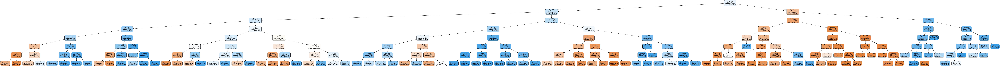

In [80]:
classifier = RandomForestClassifier(n_estimators = 90, criterion='gini', max_depth=7, min_samples_leaf=.001, min_samples_split=.001)
classifier.fit(X_train, y_train)  

# Make predictions for test data
y_pred = classifier.predict(X_test) 

# Calculate Accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print("Accuracy is :{0}".format(acc))
print(classification_report(y_true=y_test, y_pred=y_pred))

dot_data = io.StringIO()
tree.export_graphviz(classifier.estimators_[0], out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

Confusion Matrix:
 [[689 193]
 [266 763]]
Normalized Confusion Matrix
[[0.78117914 0.21882086]
 [0.2585034  0.7414966 ]]


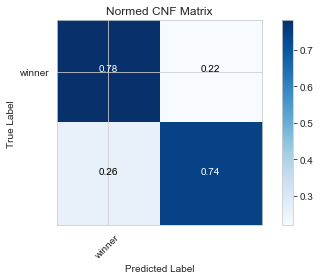

In [77]:
cnf_matrix = confusion_matrix(y_pred, y_test)
print('Confusion Matrix:\n', cnf_matrix)

# Visualizing Normalized CNF Matrix:
class_names = set(y)

plt.figure()
plot_confusion_matrix(cnf_matrix, classes = class_names, normalize=True, title='Normed CNF Matrix')
plt.show()


AUC is :0.78
              precision    recall  f1-score   support

           0       0.80      0.74      0.77       955
           1       0.76      0.81      0.78       956

   micro avg       0.78      0.78      0.78      1911
   macro avg       0.78      0.78      0.78      1911
weighted avg       0.78      0.78      0.78      1911



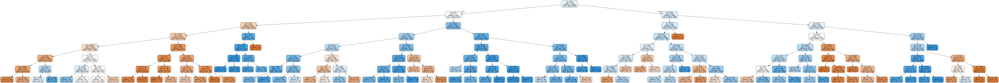

In [79]:
# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))
print(classification_report(y_true=y_test, y_pred=y_pred))

dot_data = io.StringIO()
tree.export_graphviz(classifier.estimators_[0], out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

## Evaluation:
Based on the classification summary, adaboosting yielded the best model. Given additional time, model performance could be increased further by implementing additional feature engineering. Several predictors to improve classification might include:
* First player to 3 checks
* First player to move Queen
* Number of pieces controling the e4, e5, d4, and d5 squares after 4 moves by each player.